<a href="https://colab.research.google.com/github/ludaladila/Explainable-Deep-Learning/blob/main/Explainable_Deep_Learning_XAI_05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# AIPI 590 - XAI | Assignment #05
### Yiqing Liu
[![Open In Collab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/ludaladila/Explainable-Deep-Learning/blob/main/Explainable_Deep_Learning_XAI_05.ipynb)

### Description

This project explores AI model explainability within the context of wildlife conservation using an African wildlife dataset. We utilized a pre-trained ResNet-50 model and applied three distinct visualization methods: Grad-CAM, Score-CAM, and Layer-CAM. These techniques were used to generate attention heatmaps on 6 images, each representing a unique visual challenge. The purpose was to visually document and compare how each method highlights the model's decision-making process for its predictions.

### Dataset overview

Dataset link: [African Wildlife](https://www.kaggle.com/datasets/biancaferreira/african-wildlife/data)

This data set was collected with the original goal of training an embedded device to perform real-time animal detection in nature reserves in South Africa. They are divided into four categories: buffalo, elephant, rhino and zebra.




In [66]:
!pip install torch torchvision matplotlib opendatasets numpy pillow opencv-python scikit-learn -q  kaggle -q grad-cam --quiet

In [67]:
import opendatasets as od
import torch
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
import warnings
from google.colab import userdata
from pytorch_grad_cam import GradCAM, ScoreCAM, LayerCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
warnings.filterwarnings('ignore')

# 1. Load dataset

download the dataset from kaggle first

In [68]:

#The above code snippet was generated using Claude 4.5 Sonnet on 6/10/25 at 00:15 am.
# https://claude.ai/public/artifacts/7c260fc8-c87b-4ea9-9fae-54761fb81ecc


# Data download
os.environ['KAGGLE_USERNAME'] = userdata.get('KAGGLE_USERNAME')
os.environ['KAGGLE_KEY'] = userdata.get('KAGGLE_KEY')
DATASET_PATH = '/content/african_wildlife'

os.makedirs(DATASET_PATH, exist_ok=True)

# Use the Kaggle API to download the dataset.
!kaggle datasets download -d biancaferreira/african-wildlife -p {DATASET_PATH} --unzip
!ls {DATASET_PATH}

Dataset URL: https://www.kaggle.com/datasets/biancaferreira/african-wildlife
License(s): unknown
 69% 307M/448M [00:00<00:00, 1.61GB/s]
100% 448M/448M [00:00<00:00, 1.62GB/s]
buffalo  elephant  rhino  zebra


load the dataset

In [69]:
# STEP 1: DATA LOADING
def load_dataset_structure(dataset_path):
    """
    Load and organize dataset structure
    """

    # Get all subdirectories (animal categories)
    categories = [d for d in os.listdir(dataset_path)
                  if os.path.isdir(os.path.join(dataset_path, d))]

    print(f"\nFound {len(categories)} categories: {categories}\n")

    # Collect all images
    category_data = {}

    for category in categories:
        category_path = os.path.join(dataset_path, category)
        images = [f for f in os.listdir(category_path)
                 if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

        category_data[category] = {
            'path': category_path,
            'images': images,
            'count': len(images)
        }

        print(f"{category.capitalize()}: {len(images)} images")

    return category_data

# Load dataset
category_data = load_dataset_structure(DATASET_PATH)



Found 4 categories: ['buffalo', 'elephant', 'zebra', 'rhino']

Buffalo: 376 images
Elephant: 376 images
Zebra: 376 images
Rhino: 376 images


# 2. EDA


Total images across all categories: 1504

Sample image dimensions:
  Width range: 230 - 1600 pixels
  Height range: 200 - 1044 pixels
  Average size: 693 x 455 pixels


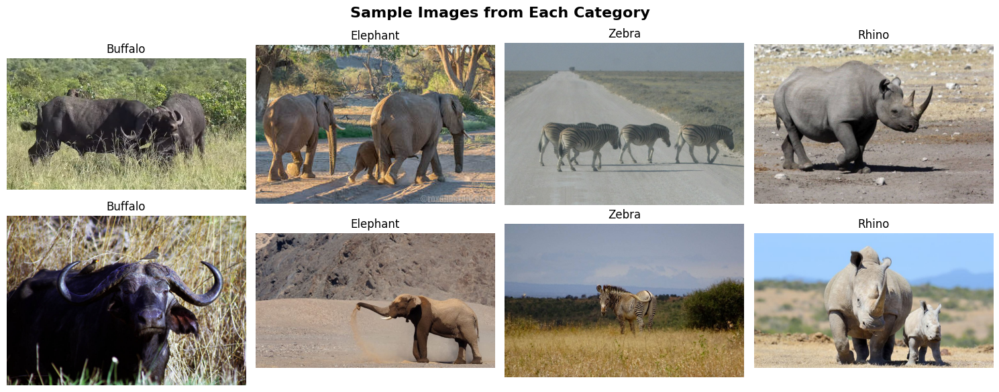

In [70]:
# STEP 2: EXPLORATORY DATA ANALYSIS (EDA)
def perform_eda(dataset_path, category_data):
    """
    Perform exploratory data analysis on the African Wildlife dataset
    """
    categories = list(category_data.keys())
    total_images = sum([data['count'] for data in category_data.values()])

    print(f"\nTotal images across all categories: {total_images}")

    # Analyze image dimensions
    sample_sizes = []
    for category in categories[:2]:  # Sample from first two categories
        category_path = category_data[category]['path']
        sample_images = category_data[category]['images'][:5]

        for img_name in sample_images:
            img_path = os.path.join(category_path, img_name)
            try:
                img = Image.open(img_path)
                sample_sizes.append(img.size)
            except:
                continue

    if sample_sizes:
        widths, heights = zip(*sample_sizes)
        print(f"\nSample image dimensions:")
        print(f"  Width range: {min(widths)} - {max(widths)} pixels")
        print(f"  Height range: {min(heights)} - {max(heights)} pixels")
        print(f"  Average size: {int(np.mean(widths))} x {int(np.mean(heights))} pixels")

    # Visualize sample images from each category
    fig, axes = plt.subplots(2, len(categories), figsize=(15, 6))
    fig.suptitle('Sample Images from Each Category', fontsize=16, fontweight='bold')

    if len(categories) == 1:
        axes = axes.reshape(-1, 1)

    for idx, category in enumerate(categories):
        category_path = category_data[category]['path']
        sample_images = category_data[category]['images'][:2]

        for row, img_name in enumerate(sample_images):
            img_path = os.path.join(category_path, img_name)
            try:
                img = Image.open(img_path)
                axes[row, idx].imshow(img)
                axes[row, idx].set_title(f"{category.capitalize()}")
                axes[row, idx].axis('off')
            except:
                axes[row, idx].axis('off')

    plt.tight_layout()
    plt.show()

# Run EDA
perform_eda(DATASET_PATH, category_data)

# 3. Load the pretrained Resnet model

In [71]:

# STEP 3: LOAD PRE-TRAINED RESNET-50 MODEL

# Load pre-trained ResNet-50
model = models.resnet50(pretrained=True)
model = model.to(device)
model.eval()

print(f"\nModel loaded successfully: {model.__class__.__name__}")
print(f"Total parameters: {sum(p.numel() for p in model.parameters()):,}")

# Define image preprocessing pipeline
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])

# ImageNet class mapping for African wildlife
IMAGENET_CLASSES = {
    340: 'zebra',
    386: 'African elephant',
    351: 'hartebeest',
    352: 'impala',
    353: 'gazelle',
    385: 'African elephant',
    # Add more if needed
}

# Mapping from dataset categories to ImageNet classes
CATEGORY_TO_IMAGENET = {
    'zebra': 340,
    'elephant': 385,
}

def get_animal_name(class_idx):
    """Convert ImageNet class index to animal name"""
    return IMAGENET_CLASSES.get(class_idx, f"Class {class_idx}")



Model loaded successfully: ResNet
Total parameters: 25,557,032


# 4. Specific images and evaluation


Evaluating: zebra/014.jpg
  Top-3 predictions:
    1. zebra (99.66%)
    2. gazelle (0.04%)
    3. Class 9 (0.02%)

Evaluating: zebra/070.jpg
  Top-3 predictions:
    1. zebra (99.91%)
    2. gazelle (0.03%)
    3. Class 9 (0.00%)

Evaluating: zebra/010.jpg
  Top-3 predictions:
    1. zebra (99.95%)
    2. Class 514 (0.01%)
    3. Class 343 (0.01%)

Evaluating: zebra/340.jpg
  Top-3 predictions:
    1. zebra (98.60%)
    2. gazelle (0.49%)
    3. impala (0.25%)

Evaluating: zebra/305.jpg
  Top-3 predictions:
    1. zebra (99.79%)
    2. gazelle (0.08%)
    3. hartebeest (0.05%)

Evaluating: elephant/008.jpg
  Top-3 predictions:
    1. African elephant (95.33%)
    2. African elephant (3.95%)
    3. Class 101 (0.70%)


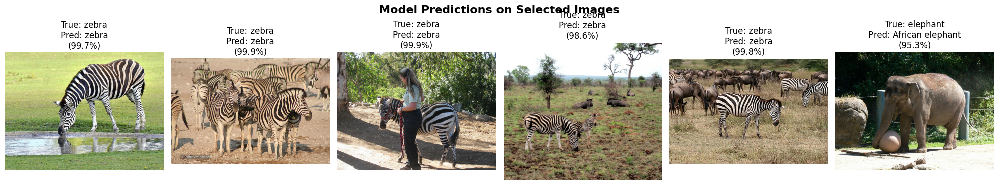

In [72]:
# STEP 4: SELECT AND EVALUATE SPECIFIC IMAGES

# Define the selected images
SELECTED_IMAGES = [
    'zebra/014.jpg',
    'zebra/070.jpg',
    'zebra/010.jpg',
    'zebra/340.jpg',
    'zebra/305.jpg',
    'elephant/008.jpg'
]

def predict_image(image_path, model, preprocess, device):
    """
    Predict class for a single image
    """
    # Load and preprocess image
    img = Image.open(image_path).convert('RGB')
    img_tensor = preprocess(img).unsqueeze(0).to(device)

    # Get predictions
    with torch.no_grad():
        outputs = model(img_tensor)
        probabilities = F.softmax(outputs, dim=1)

    # Get top-5 predictions
    top_probs, top_indices = torch.topk(probabilities, 5)
    top_probs = top_probs.cpu().numpy()[0]
    top_indices = top_indices.cpu().numpy()[0]

    return img, top_probs, top_indices

# Evaluate selected images
selected_results = []

for img_path in SELECTED_IMAGES:
    full_path = os.path.join(DATASET_PATH, img_path)

    if not os.path.exists(full_path):
        print(f"\nWarning: {img_path} not found, skipping...")
        continue

    print(f"\nEvaluating: {img_path}")

    # Get predictions
    img, top_probs, top_indices = predict_image(full_path, model, preprocess, device)

    # Store results
    selected_results.append({
        'path': img_path,
        'image': img,
        'top_probs': top_probs,
        'top_indices': top_indices
    })

    # Print top-3 predictions with animal names
    print("  Top-3 predictions:")
    for i in range(3):
        class_idx = top_indices[i]
        prob = top_probs[i]
        animal_name = get_animal_name(class_idx)
        print(f"    {i+1}. {animal_name} ({prob*100:.2f}%)")

# Visualize predictions
if selected_results:
    fig, axes = plt.subplots(1, len(selected_results), figsize=(20, 4))
    fig.suptitle('Model Predictions on Selected Images', fontsize=16, fontweight='bold')

    if len(selected_results) == 1:
        axes = [axes]

    for idx, result in enumerate(selected_results):
        axes[idx].imshow(result['image'])

        # Create prediction label
        top_class = result['top_indices'][0]
        top_prob = result['top_probs'][0]
        animal_name = get_animal_name(top_class)

        true_category = result['path'].split('/')[0]
        axes[idx].set_title(f"True: {true_category}\nPred: {animal_name}\n({top_prob*100:.1f}%)")
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

### chosen images
For the chosen images, they have different aspects.

1. A clear single zebra: To show a standard, successful case where all methods should work well.

2. A group of zebras: To test how the model and methods perform when identifying multiple targets in one scene.

3. An occluded zebra: To see if the model can still find key features when the target is partially hidden.

4. Zebras in a complex scene: To evaluate the model's ability to focus on the correct animals when there is a busy background.

5. Zebras in a complex scene: To evaluate the model's ability to focus on the correct animals when there are other distracting animals .

6. A clear single elephant: For comparison, to check if the model focuses on different, unique features for a different type of animal.

# 5. GradCAM and variants Implementation

In this section, we present a visual analysis of five carefully selected representative images to compare the performance of Grad-CAM, Score-CAM, and Layer-CAM in different scenarios. Our goal is to understand which image features the model focuses on when making predictions.

Generating GradCAM...
Generating ScoreCAM...


100%|██████████| 128/128 [00:01<00:00, 82.67it/s]


Generating LayerCAM...


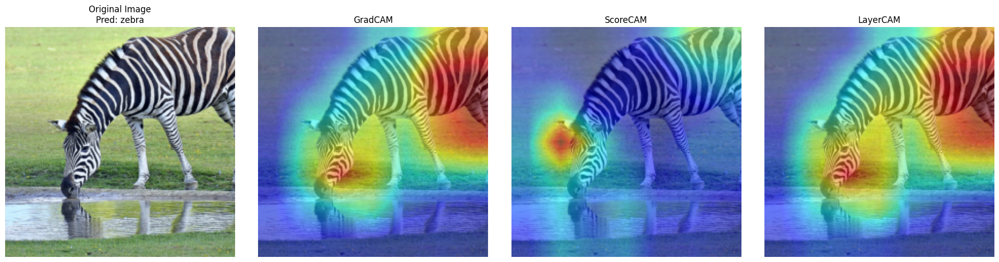

Generating GradCAM...
Generating ScoreCAM...


100%|██████████| 128/128 [00:01<00:00, 87.11it/s]


Generating LayerCAM...


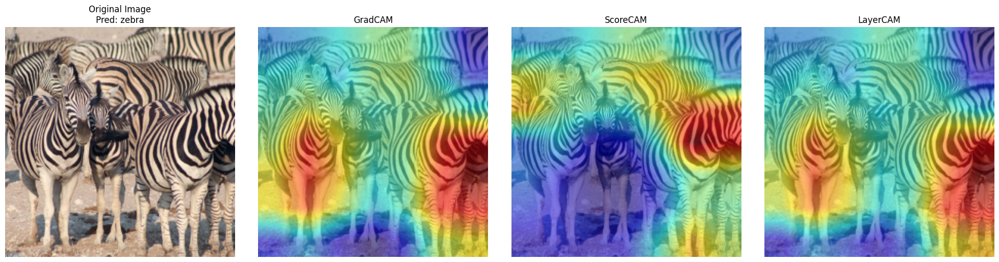

Generating GradCAM...
Generating ScoreCAM...


100%|██████████| 128/128 [00:01<00:00, 87.77it/s]


Generating LayerCAM...


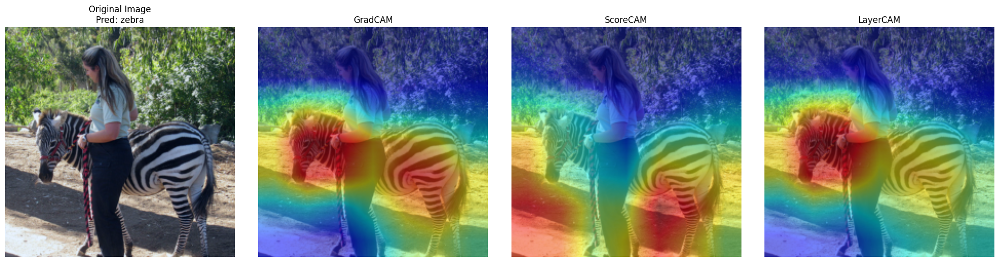

Generating GradCAM...
Generating ScoreCAM...


100%|██████████| 128/128 [00:01<00:00, 86.49it/s]


Generating LayerCAM...


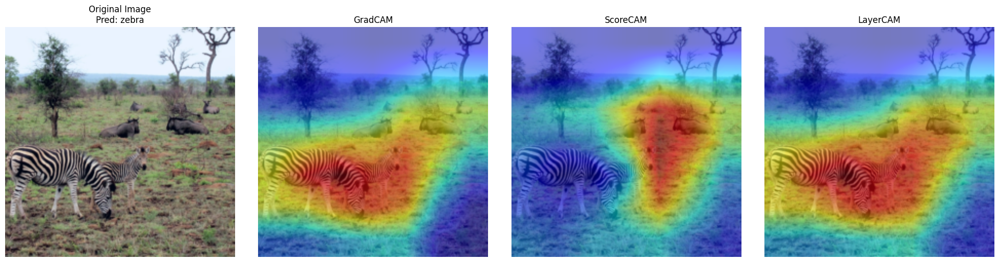

Generating GradCAM...
Generating ScoreCAM...


100%|██████████| 128/128 [00:01<00:00, 87.86it/s]


Generating LayerCAM...


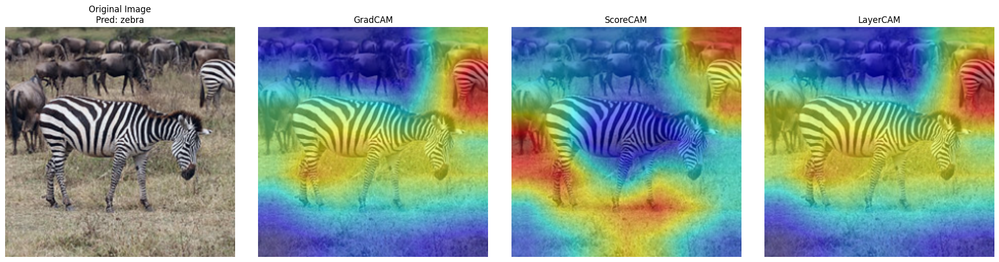

Generating GradCAM...
Generating ScoreCAM...


100%|██████████| 128/128 [00:01<00:00, 87.89it/s]


Generating LayerCAM...


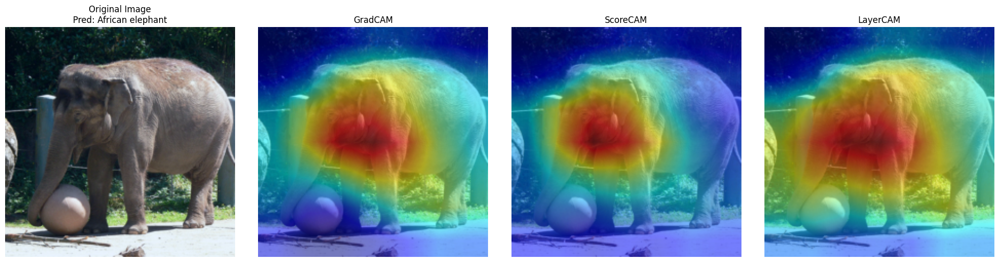

In [73]:
#The above code snippet was generated using Claude 4.5 Sonnet on 6/10/25 at 00:15 am and then modified in order to optimize the layout of the generated image
# https://claude.ai/public/artifacts/7c260fc8-c87b-4ea9-9fae-54761fb81ecc

# 5. Grad CAM Implementation
def visualize_cams(model, target_layers, input_tensor, original_image_tensor, target_class):
    """
    Generate and display visualizations for three CAM methods
    """

    # Convert the original image tensor to a numpy array suitable for visualization
    img_np = original_image_tensor.squeeze().permute(1, 2, 0).cpu().numpy()
    # Normalize to the 0-1 range
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

    # Define CAM methods
    cam_methods = {
        "GradCAM": GradCAM(model=model, target_layers=target_layers),
        "ScoreCAM": ScoreCAM(model=model, target_layers=target_layers),
        "LayerCAM": LayerCAM(model=model, target_layers=target_layers)
    }

    # Create the plotting figure and axes
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # Display the original image
    axes[0].imshow(img_np)
    pred_name = get_animal_name(target_class) # Assumes get_animal_name() is defined
    axes[0].set_title(f"Original Image\nPred: {pred_name}", fontsize=12)
    axes[0].axis('off')

    # Loop through each CAM method to generate and display the heatmap
    plot_idx = 1
    for name, cam_algorithm in cam_methods.items():
        print(f"Generating {name}...")
        targets = [ClassifierOutputTarget(target_class)]

        # Generate the heatmap (grayscale_cam)
        grayscale_cam = cam_algorithm(input_tensor=input_tensor, targets=targets)
        grayscale_cam = grayscale_cam[0, :]

        # Overlay the heatmap onto the original image
        visualization = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)

        # Display the result
        axes[plot_idx].imshow(visualization)
        axes[plot_idx].set_title(name, fontsize=12)
        axes[plot_idx].axis('off')
        plot_idx += 1

    plt.tight_layout()
    plt.show()


# --- Loop through the selected images ---

# Define the target layer(s)
target_layers = [model.layer4[-1]]

for result_info in selected_results:
    img_path = result_info['path']

    # Load and preprocess the image
    full_path = os.path.join(DATASET_PATH, img_path)
    img = Image.open(full_path).convert('RGB')
    input_tensor = preprocess(img).unsqueeze(0).to(device)

    # Get the predicted class from the previous evaluation step
    predicted_class = result_info['top_indices'][0]

    # Generate and display the visualizations
    visualize_cams(model, target_layers, input_tensor, input_tensor.clone(), predicted_class)

### Comparative analysis between GradCAM and variants

1. For the clear single zebra: Grad-CAM and Layer-CAM performed better, while score-CAM ignored some parts of the zebra's body. However, they both focused more on the head and torso stripes.

2. For the group of zebras: Because the zebras overlap, the evidence, while distributed across multiple zebras, is still primarily focused on the front row. Grad-CAM had the widest range, while Score-CAM had the smallest.

3. For the occluded zebra: Grad-CAM performed best, correctly identifying the visible parts of the zebra's striped body.Score-CAM is weak, it considered some background as a zebra.

4. For the complex scene: Grad-CAM and Layer-CAM were able to lock onto the front zebra, but Score-CAM could not.

5. For the complex scene: Grad and layer can their hotspots on the zebra's trunk strip in the upper right corner.while Score-CAM has a small amount of environmental interference and fails to recognize the zebra's trunk in the foreground.

6. For the clear single elephant: The model intelligently focuses its attention on the elephant's head, but Layer and Grad's hotspot is larger and extends to the ground and back; Score's hotspot is the smallest, converging on the head.

Overall, Grad-CAM and Layer-CAM are more stable in locking onto targets (a single animal and the zebra and elephant heads in the front row), while Score-CAM is prone to missing detections or being interfered with by the environment in the presence of occlusion and complex backgrounds.


# 7. Reflection and Conclusion



1.  Model attention appropriateness

The model usually attends to class-relevant cues—zebra body stripes and the elephant head

2. Surprising/misleading examples

Score-CAM has unstable performance, it often misses the target or is distracted by the background.

3. The significance of explainability

These findings highlight the need to audit predictions with multiple CAM variants, and reduce background bias in data.
In wildlife monitoring, this explanations can improve trust and help guide dataset curation and model updates.
